In [1]:
import wave
import pyroomacoustics as pa
import numpy as np
import scipy.signal as sp
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import display, Audio
import soundfile as sf
import scipy

np.random.seed(0)

In [2]:
def plot_spectrogram(data, sample_rate):
    """データからスペクトログラムを作成し、それをプロットする関数

    Parameters:
    data: numpy array
        音声データ
    sample_rate: int
        サンプリングレート（Hz）
    """
    fig = plt.figure(figsize=(10, 4))
    spectrum, freqs, t, im = plt.specgram(data, NFFT=512, noverlap=int(512 / 16 * 15), Fs=sample_rate, cmap="inferno")
    fig.colorbar(im).set_label("Intensity [dB]")
    plt.xlabel("Time [sec]")
    plt.ylabel("Frequency [Hz]")
    plt.show()

# 6.3 ステアリングベクトルの計算

In [3]:
def calculate_steering_vector(mic_alignments, source_locations, freqs, sound_speed=340, is_use_far=False):
    """
    Calculate the steering vector.

    Parameters:
    mic_alignments : ndarray
        Microphone positions, 3 x M dimensional ([[x,y,z], [x,y,z],...])
    source_locations : ndarray
        Source positions, 3 x Ns dimensional ([[x,y,z], [x,y,z],...])
    freqs : array
        Frequencies, Nk dimensional array ([f1,f2,f3,...])
    sound_speed : float
        Sound speed in m/s. Default is 340.
    is_use_far : bool
        If True, use 'Far'. If False, use 'Near'. Default is False.

    Returns:
    steering_vector : ndarray
        Steering vector, Nk x Ns x M dimensional array.
    """

    # マイク数を取得
    n_channels = np.shape(mic_alignments)[1]

    if is_use_far:
        # 音源位置を正規化
        norm_source_locations = source_locations / np.linalg.norm(source_locations, 2, axis=0, keepdims=True)
        # 位相を求める
        steering_phase = np.einsum("k,ism,ism->ksm", 2.0j * np.pi / sound_speed * freqs, norm_source_locations[..., None], mic_alignments[:, None, :])
        # ステアリングベクトルを算出
        steering_vector = 1.0 / np.sqrt(n_channels) * np.exp(steering_phase)

    else:
        # 音源とマイクの距離を求める
        distance = np.sqrt(np.sum(np.square(source_locations[..., None] - mic_alignments[:, None, :]), axis=0))
        # 遅延時間(delay) [sec]
        delay = distance / sound_speed
        # ステアリングベクトルの位相を求める
        steering_phase = np.einsum("k,sm->ksm", -2.0j * np.pi * freqs, delay)
        # 音量の減衰
        steering_decay_ratio = 1.0 / distance
        # ステアリングベクトルを求める
        steering_vector = steering_decay_ratio[None, ...] * np.exp(steering_phase)
        # 大きさを1で正規化する
        steering_vector = steering_vector / np.linalg.norm(steering_vector, 2, axis=2, keepdims=True)

    return steering_vector

In [4]:
# サンプリングレート [Hz]
sample_rate = 16000
# フレームサイズ
N = 1024
# 周波数の数
Nk = N / 2 + 1

# 各ビンの周波数
freqs = np.arange(0, Nk, 1) * sample_rate / N

# マイクロホンアレイのマイク配置
mic_alignments = np.array(
    [
        [-0.01, 0.0, 0.0],
        [0.01, 0.0, 0.0],
    ]
).T

# 音源の方向
doas = np.array([[np.pi / 2, 0], [np.pi / 2, np.pi]])

# 音源とマイクロホンの距離
for distance in [0.001, 0.01, 0.1, 1, 10]:

    # 音源の位置ベクトル
    source_locations = np.zeros((3, doas.shape[0]), dtype=doas.dtype)
    source_locations[0, :] = np.cos(doas[:, 1]) * np.sin(doas[:, 0])
    source_locations[1, :] = np.sin(doas[:, 1]) * np.sin(doas[:, 0])
    source_locations[2, :] = np.cos(doas[:, 0])
    source_locations *= distance

    # Near仮定に基づくステアリングベクトルを計算: steering_vectors(Nk x Ns x M)
    near_steering_vectors = calculate_steering_vector(mic_alignments, source_locations, freqs, is_use_far=False)

    # Far仮定に基づくステアリングベクトルを計算: steering_vectors(Nk x Ns x M)
    far_steering_vectors = calculate_steering_vector(mic_alignments, source_locations, freqs, is_use_far=True)

    # 内積を計算
    inner_product = np.einsum("ksm,ksm->ks", np.conjugate(near_steering_vectors), far_steering_vectors)
    print(f"距離: {distance}, 内積: {np.average(np.abs(inner_product)):.4f}")

距離: 0.001, 内積: 0.7304
距離: 0.01, 内積: 0.7071
距離: 0.1, 内積: 0.9950
距離: 1, 内積: 1.0000
距離: 10, 内積: 1.0000


# 6.4 遅延和アレイ (DSBF: Delay and Sum Beamformer)

* 残響なしでシミュレーション
* 目的音の方向の情報からステアリングベクトルを Near 仮定に基づき生成

In [5]:
class DSBF:
    def __init__(self):
        self.sample_rate = 16000
        self.N = 1024               # フレームサイズ
        self.Nk = self.N / 2 + 1    # 周波数の数
        self.freqs = np.arange(0, self.Nk, 1) * self.sample_rate / self.N  # 各ビンの周波数
        self.room_dim = np.array([10.0, 10.0, 10.0])
        self.mic_array_loc = self.room_dim / 2 + np.random.randn(3) * 0.1
        self.distance = 1.0  # 音源とマイクロホンの距差

    def set_audio_file(self, clean_wave_files, doas):
        self.clean_data = []
        self.n_samples = 0
        self.n_sources = len(clean_wave_files)

        for clean_wave_file in clean_wave_files:
            with wave.open(clean_wave_file) as wav:
                data = wav.readframes(wav.getnframes())
                data = np.frombuffer(data, dtype=np.int16)
                self.n_samples = max(wav.getnframes(), self.n_samples)
                data = data / np.iinfo(np.int16).max
                self.clean_data.append(data)

        for s in range(self.n_sources):
            if len(self.clean_data[s]) < self.n_samples:
                pad_width = self.n_samples - len(self.clean_data[s])
                self.clean_data[s] = np.pad(self.clean_data[s], (0, pad_width), "constant")
            self.clean_data[s] /= np.std(self.clean_data[s])

        self.clean_data = np.array(self.clean_data)
        self.doas = doas    # 音源の場所

    def set_microphone(self, mic_alignments):
        self.mic_alignments = mic_alignments
        self.R = self.mic_alignments.T + self.mic_array_loc[:, None]

    def run_simulation(self, SNR=20.0, display_room=False, save_simulated_data=False):
        room = self._create_room()
        source_locations = self._calculate_source_locations()
        self._add_sources_to_room(room, source_locations)
        if display_room:
            room.plot()
        room.simulate(snr=SNR)

        multi_conv_data = room.mic_array.signals  # シミュレーション音源
        self._visualize_audio(multi_conv_data[0], save_simulated_data)

        near_steering_vectors = calculate_steering_vector(self.R, source_locations[:, :1], self.freqs, is_use_far=False)
        t, stft_data = self._calculate_stft(multi_conv_data)
        c_hat = self._process_beamforming(near_steering_vectors, stft_data)

        ds_out = self._inverse_stft(c_hat)
        self._visualize_audio(ds_out[0])

    def _create_room(self):
        room = pa.ShoeBox(self.room_dim, fs=self.sample_rate, max_order=0)
        room.add_microphone_array(pa.MicrophoneArray(self.R, fs=room.fs))
        return room

    def _calculate_source_locations(self):
        source_locations = np.zeros((3, self.doas.shape[0]), dtype=self.doas.dtype)
        source_locations[0, :] = np.cos(self.doas[:, 1]) * np.sin(self.doas[:, 0])
        source_locations[1, :] = np.sin(self.doas[:, 1]) * np.sin(self.doas[:, 0])
        source_locations[2, :] = np.cos(self.doas[:, 0])
        source_locations *= self.distance
        source_locations += self.mic_array_loc[:, None]
        return source_locations

    def _add_sources_to_room(self, room, source_locations):
        for s in range(self.n_sources):
            room.add_source(source_locations[:, s], signal=self.clean_data[s])

    def _calculate_stft(self, multi_conv_data):
        _, t, stft_data = sp.stft(multi_conv_data, fs=self.sample_rate, window="hann", nperseg=self.N)
        return t, stft_data

    def _process_beamforming(self, near_steering_vectors, stft_data):
        s_hat = np.einsum("ksm,mkt->skt", np.conjugate(near_steering_vectors), stft_data)
        c_hat = np.einsum("skt,ksm->mskt", s_hat, near_steering_vectors)
        return c_hat

    def _inverse_stft(self, c_hat):
        _, ds_out = sp.istft(c_hat[0], fs=self.sample_rate, window="hann", nperseg=self.N)
        ds_out = ds_out * np.iinfo(np.int16).max / 20.0
        return ds_out

    def _visualize_audio(self, data, save_data=False):
        display(Audio(data, rate=self.sample_rate))
        if save_data:
            data_normalized = np.interp(data, (data.min(), data.max()), (-1, 1))
            sf.write("dst.wav", data_normalized, self.sample_rate)
        plot_spectrogram(data, self.sample_rate)

## 単一音源で背景雑音が混入した場合

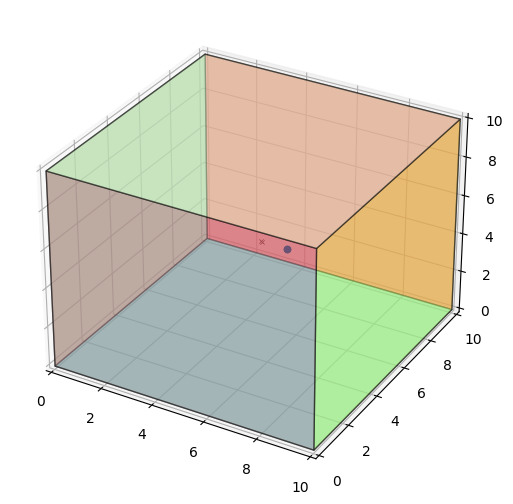

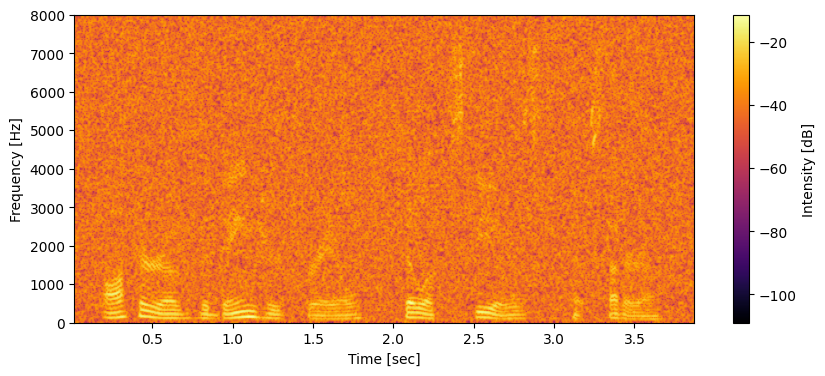

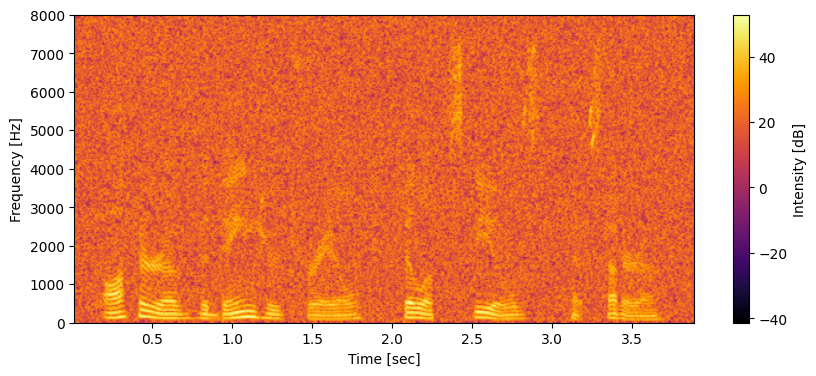

In [6]:
dsbf = DSBF()
clean_wave_files = ["../arctic_a0001.wav"]
doas = np.array([[np.pi / 2.0, 0]])
dsbf.set_audio_file(clean_wave_files, doas)

mic_alignments_2 = np.array(
    [
        [-0.01, 0.0, 0.0],
        [0.01, 0.0, 0.0],
    ]
)
dsbf.set_microphone(mic_alignments_2)
dsbf.run_simulation(1, display_room=True)

* スペクトログラムを見ると、少しだけ背景が黒くなっていることがわかるが、ほとんど影響がわからない

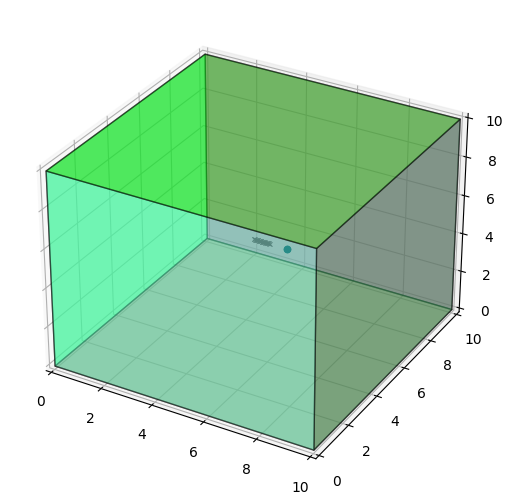

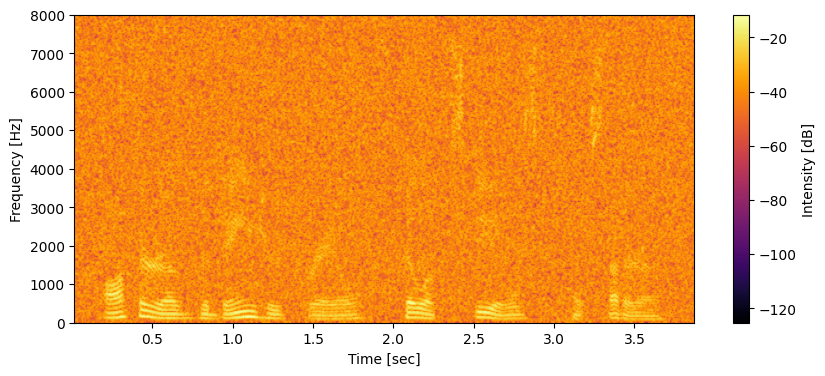

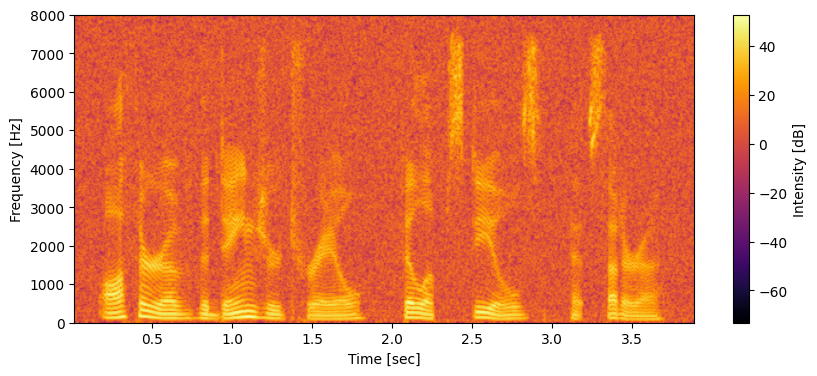

In [7]:
mic_alignments_32 = np.array([[x, 0.0, 0.0] for x in np.arange(-0.31, 0.32, 0.02)])
dsbf.set_microphone(mic_alignments_32)
dsbf.run_simulation(1, display_room=True)

* マイク数を 32 にすると雑音がよく抑圧されている
* マイクロホンの数を増やすと雑音抑圧効果が増す
* 遅延和アレイはマイク数が多いときに効果を発揮する

## 他の人の声（干渉音）がマイクに混入した時

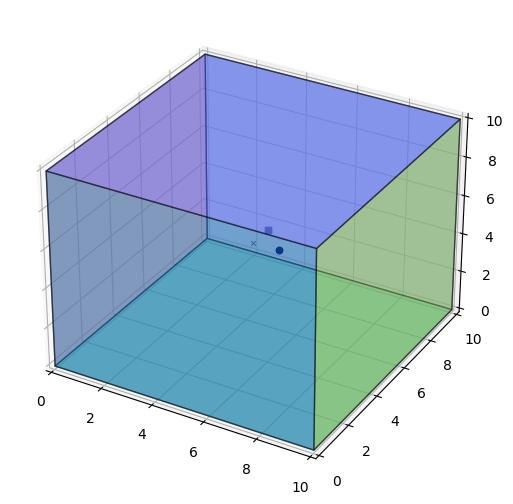

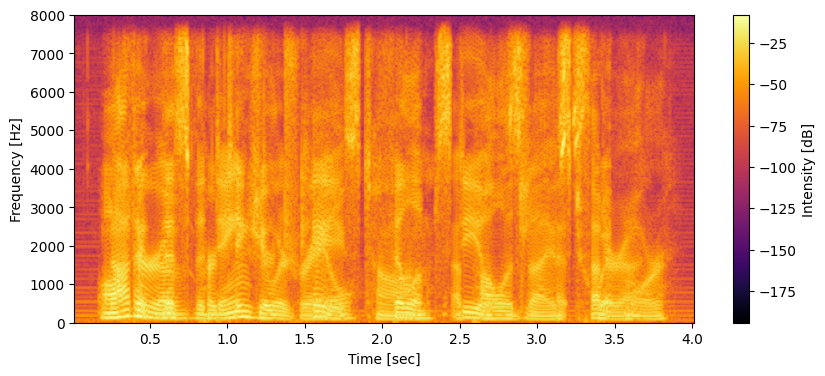

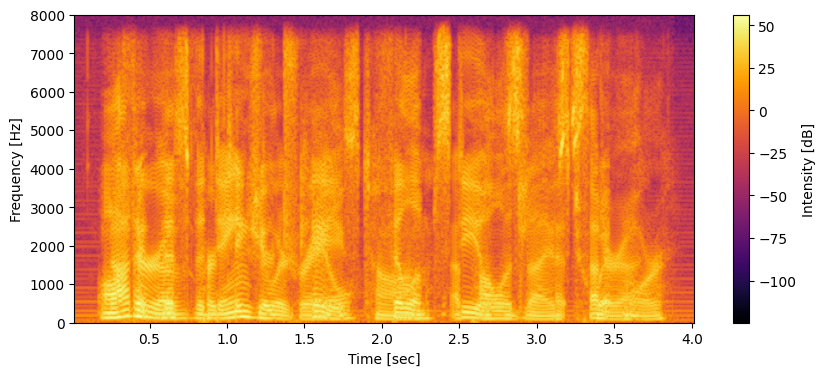

In [8]:
dsbf = DSBF()
clean_wave_files = ["../arctic_a0001.wav", "../arctic_a0002.wav"]
doas_2 = np.array([[np.pi / 2.0, 0], [np.pi / 2.0, np.pi / 2.0]])
dsbf.set_audio_file(clean_wave_files, doas_2)
dsbf.set_microphone(mic_alignments_2)
dsbf.run_simulation(90, display_room=True)

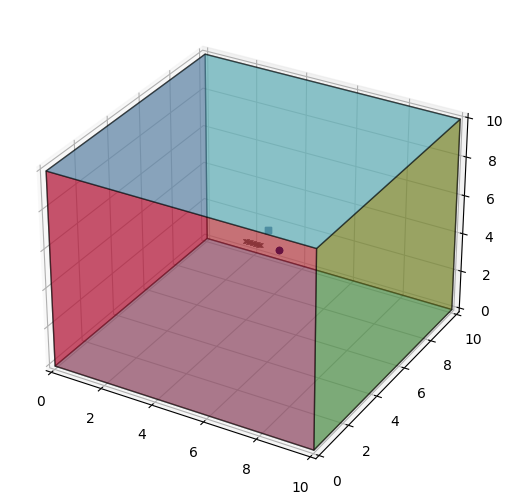

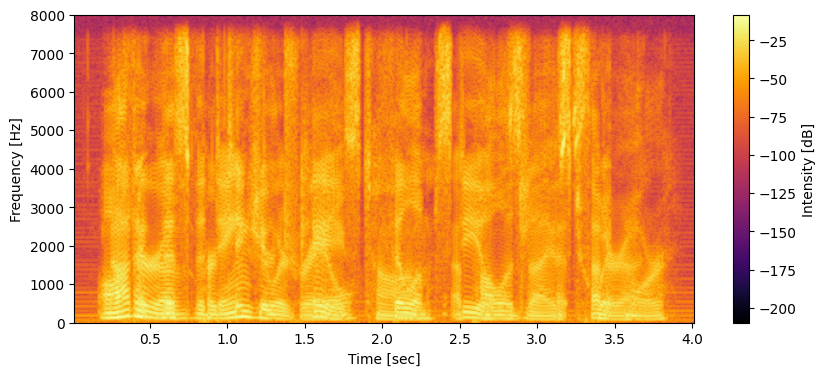

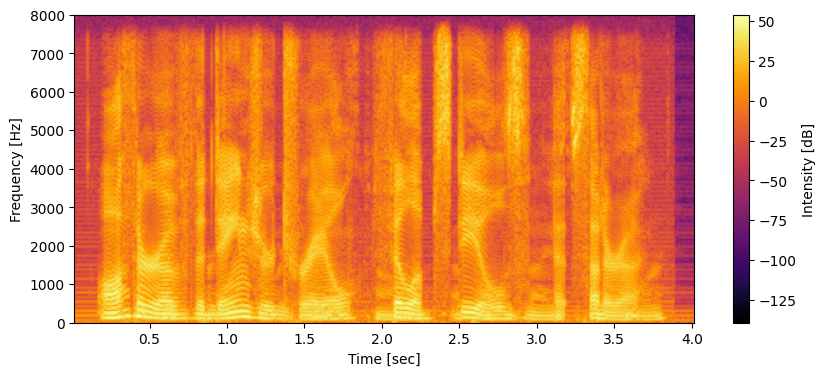

In [9]:
dsbf.set_microphone(mic_alignments_32)
dsbf.run_simulation(90, display_room=True)

マイク数を増やすと所望音の音声に近い信号が得られる

## 指向特性の計算

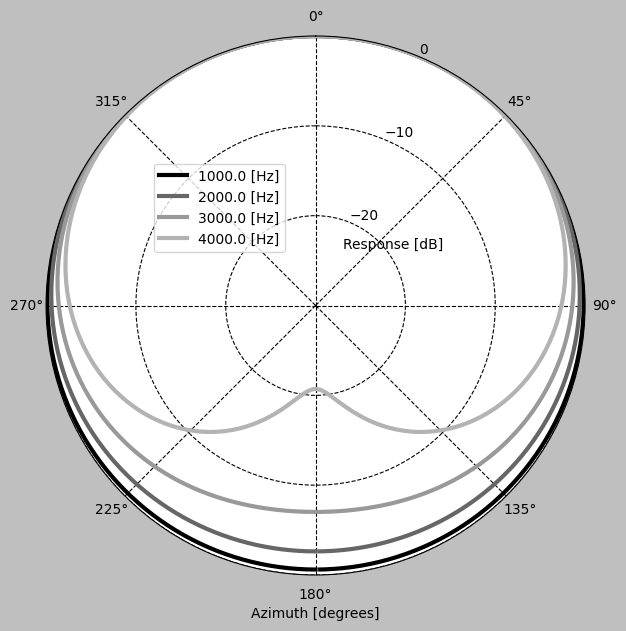

In [10]:
def plot_polar_pattern(mic_alignments, draw_freqs):
    doas = np.array([[np.pi / 2.0, theta] for theta in np.arange(-np.pi, np.pi, 1.0 / 180.0 * np.pi)])
    source_locations = np.zeros((3, doas.shape[0]), dtype=doas.dtype)
    source_locations[0, :] = np.cos(doas[:, 1]) * np.sin(doas[:, 0])
    source_locations[1, :] = np.sin(doas[:, 1]) * np.sin(doas[:, 0])
    source_locations[2, :] = np.cos(doas[:, 0])
    distance = 1.0  # 音源とマイクロホンの距差
    source_locations *= distance

    freqs = np.arange(0, Nk, 1) * sample_rate / N  # 各ビンの周波数

    # Near仮定に基づくステアリングベクトルを計算: steering_vectors(Nk x Ns x M)
    near_steering_vectors = calculate_steering_vector(mic_alignments.T, source_locations, freqs, is_use_far=False)

    # theta=0に最も近いステアリングベクトルを取り出す
    desired_index = np.argmin(np.abs(doas[:, 1]), axis=0)

    # 所望音のステアリングベクトル
    desired_steering_vector = near_steering_vectors[:, desired_index, :]

    # 内積計算
    directivity_pattern = np.square(np.abs(np.einsum("km,ksm->ks", np.conjugate(desired_steering_vector), near_steering_vectors)))

    plt.style.use("grayscale")
    fig = plt.figure(figsize=(7, 7))
    ax = plt.subplot(111, projection="polar")

    # グラフの向き、グリッドの線種を指定
    ax.set_theta_zero_location("N")
    ax.set_theta_direction("clockwise")
    ax.grid(linestyle="--")

    # y軸のラベル
    ax.yaxis.labelpad = -250
    ylabel = plt.ylabel("Response [dB]")
    ylabel.set_position((0, 0.6))
    ylabel.set_rotation(0)
    plt.yticks([-20, -10, 0])
    plt.ylim([-30, 0])
    # x軸のラベル
    plt.xlabel("Azimuth [degrees]")

    # 描画する周波数
    draw_freq_list = np.argmin(np.abs(freqs[:, None] - draw_freqs[None, :]), axis=0)

    for draw_freq_index in draw_freq_list:
        # 周波数毎に指向特性を描画
        plt.plot(doas[:, 1], 10.0 * np.log10(directivity_pattern[draw_freq_index, :]), lw=3, label="{} [Hz]".format(freqs[draw_freq_index]))
    plt.legend(loc=(0.2, 0.6))
    plt.show()

mic_alignments = np.array([[x, 0.0, 0.0] for x in np.arange(-0.01, 0.02, 0.02)])
draw_freqs = np.array([1000, 2000, 3000, 4000])
plot_polar_pattern(mic_alignments, draw_freqs)

* マイクが 2 つの場合、あまり減衰しない
* 1000 Hz などの低周波数では抑圧量が小さい
* 周波数が高くなるほど抑圧量が大きくなる

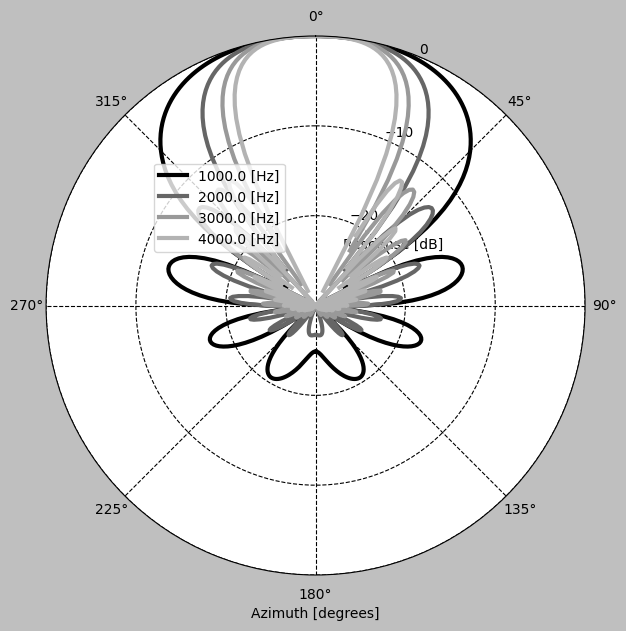

In [11]:
mic_alignments = np.array([[x, 0.0, 0.0] for x in np.arange(-0.31, 0.32, 0.02)])
plot_polar_pattern(mic_alignments, draw_freqs)

* マイク 32 個だと、2 個に比べて低周波数の場合でもかなり抑圧量が高くなっている
* 目的音とは正反対に位置する音源がかなり抑圧されている
* DSBF はマイク数が多いときは高い雑音・干渉音抑圧量を示す
* 実際にはマイク数が多いと、コストがかさんだりマイクロホンアレイが大規模になったりするため望ましくない
* そのため少数のマイクで高い雑音・干渉音の抑圧量を得ることが望まれる
* そのような音源分離法として検討が進められてきたのが、最小分散無歪ビームフォーマ（MVDR）などの適応フィルタと呼ばれるビームフォーマ法

# 6.5 最小分散無歪ビームフォーマ (MVDR: Minimum Variance Distortionless Response Beamformer)

## 単一音源で背景雑音が混入した場合

In [12]:
class MVDR(DSBF):
    def _process_beamforming(self, near_steering_vectors, stft_data):
        Rcov = np.einsum("mkt,nkt->kmn", stft_data, np.conjugate(stft_data))  # 共分散行列
        Rcov_inverse = np.linalg.pinv(Rcov)                                   # 共分散行列の逆行列
        # フィルタを計算する
        Rcov_inverse_a = np.einsum("kmn,kn->km", Rcov_inverse, near_steering_vectors[:, 0, :])
        a_H_Rcov_inverse_a = np.einsum("kn,kn->k", np.conjugate(near_steering_vectors[:, 0, :]), Rcov_inverse_a)
        w_mvdr = Rcov_inverse_a / np.maximum(a_H_Rcov_inverse_a, 1.0e-18)[:, None]
        # フィルタをかける
        s_hat = np.einsum("km,mkt->kt", np.conjugate(w_mvdr), stft_data)
        # ステアリングベクトルをかける
        c_hat = np.einsum("kt,km->mkt", s_hat, near_steering_vectors[:, 0, :])
        return c_hat[:, np.newaxis, :, :]

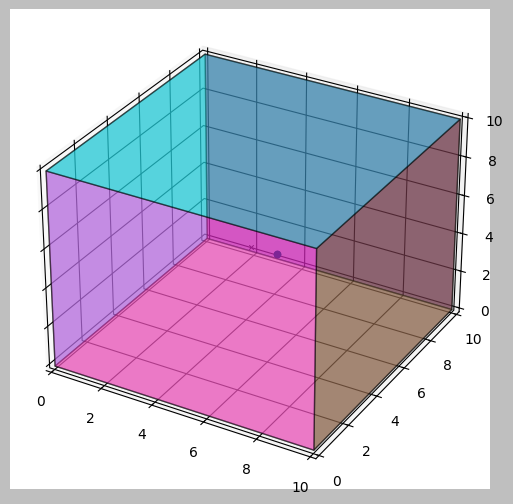

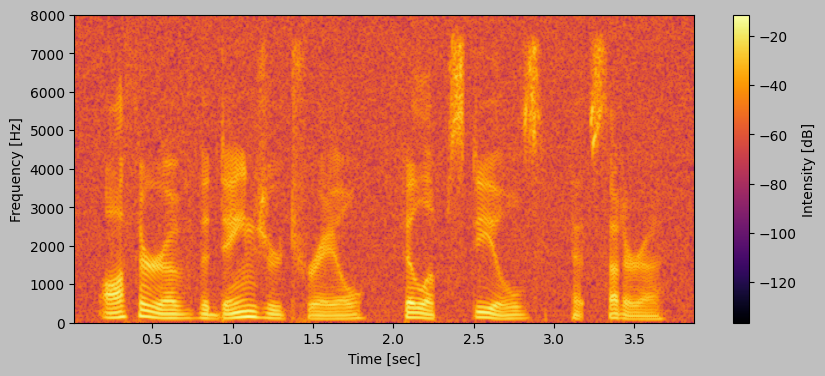

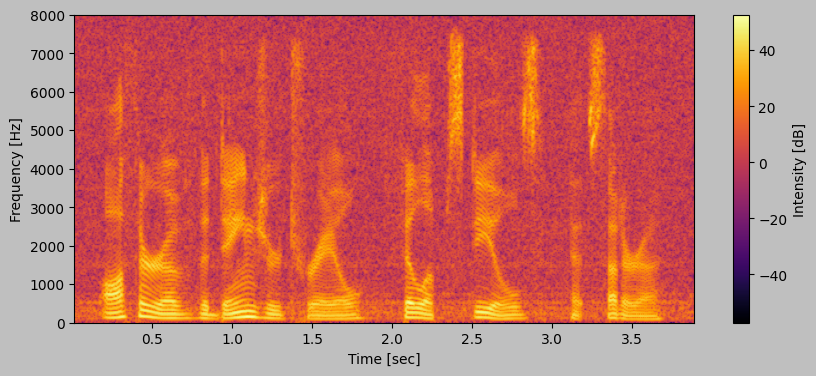

In [13]:
mvdr = MVDR()
clean_wave_files = ["../arctic_a0001.wav"]
doas = np.array([[np.pi / 2.0, 0]])
mvdr.set_audio_file(clean_wave_files, doas)

mic_alignments = np.array(
    [
        [-0.01, 0.0, 0.0],
        [0.01, 0.0, 0.0],
    ]
)
mvdr.set_microphone(mic_alignments)
mvdr.run_simulation(20, display_room=True)

## 他の人の声（干渉音）がマイクに混入した時

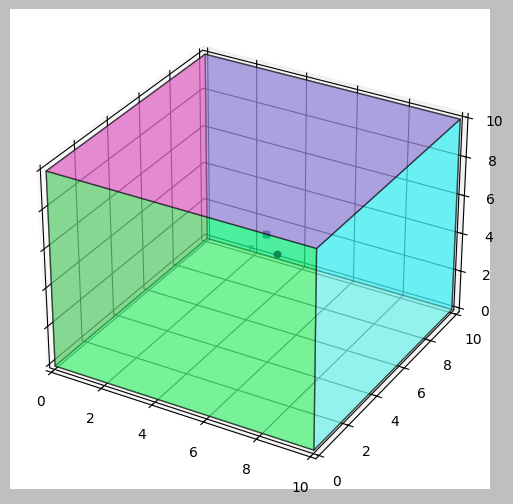

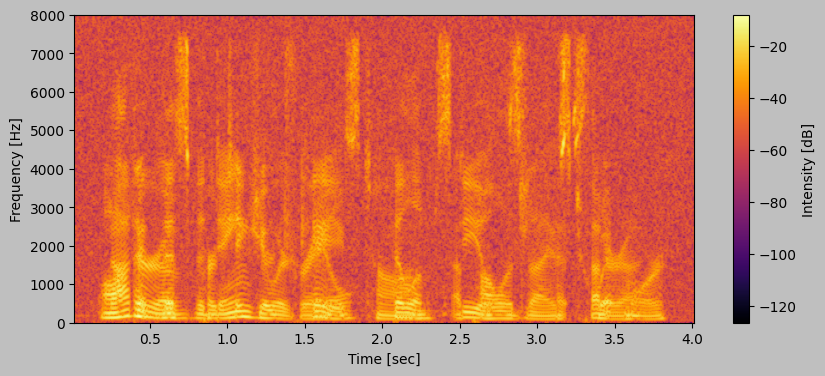

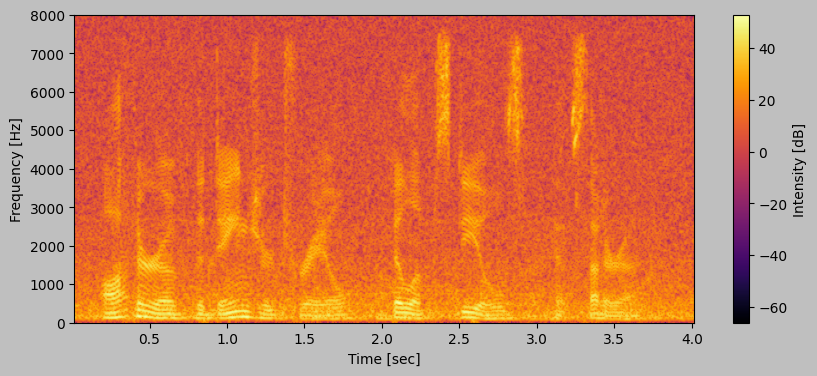

In [14]:
clean_wave_files = ["../arctic_a0001.wav", "../arctic_a0002.wav"]
doas = np.array([[np.pi / 2.0, 0], [np.pi / 2.0, np.pi / 2.0]])
mvdr.set_audio_file(clean_wave_files, doas)

mvdr.run_simulation(20, display_room=True)

* 背景雑音では DSBF と同様に MVDR でもあまりよい抑圧結果は得られない
* しかし、干渉音の抑圧に関しては MVDR の方が DSBF よりも優れている

## 指向特性

* MVDR では全方向の雑音をまんべんなく抑圧するのを諦め、特定の方向から到来する雑音を効果的に抑圧するフィルタを生成
* この効果的に抑圧できる方向を死角 (null) と呼ぶ
* null の数は最大でマイク数 - 1 まで

## 最尤ビームフォーマ (MLBF: Maximum Likelihood Beamformer)

* MVDR では雑音の情報を入力共分散行列の形で利用するが、もし雑音信号だけが存在する時間帯が存在すると、その時間帯のマイク入力信号を使ってよりよいフィルタを構築できる
* このようなフィルタは MLBF と呼ばれる
* MLBF と MVDR の違いは、入力共分散行列の計算方法のみ

In [15]:
class MLBF(DSBF):
    def set_audio_file(self, clean_wave_files, doas, n_noise_only):
        self.clean_data = []
        self.n_samples = 0
        self.n_sources = len(clean_wave_files)
        self.n_noise_only = n_noise_only

        for clean_wave_file in clean_wave_files:
            with wave.open(clean_wave_file) as wav:
                data = wav.readframes(wav.getnframes())
                data = np.frombuffer(data, dtype=np.int16)
                self.n_samples = max(wav.getnframes(), self.n_samples)
                data = data / np.iinfo(np.int16).max
                self.clean_data.append(np.concatenate((np.zeros(n_noise_only), data)))

        for s in range(self.n_sources):
            if len(self.clean_data[s]) < self.n_samples:
                pad_width = self.n_samples - len(self.clean_data[s])
                self.clean_data[s] = np.pad(self.clean_data[s], (0, pad_width), "constant")
            self.clean_data[s] /= np.std(self.clean_data[s])

        self.clean_data = np.array(self.clean_data)
        self.doas = doas    # 音源の場所

    def run_simulation(self, SNR, display_room=False, save_simulated_data=False):
        room = self._create_room()
        source_locations = self._calculate_source_locations()
        self._add_sources_to_room(room, source_locations)
        if display_room:
            room.plot()
        room.simulate(snr=SNR)

        multi_conv_data = room.mic_array.signals  # シミュレーション音源
        self._visualize_audio(multi_conv_data[0, self.n_noise_only:], save_simulated_data)

        near_steering_vectors = calculate_steering_vector(self.R, source_locations[:, :1], self.freqs, is_use_far=False)
        t, stft_data = self._calculate_stft(multi_conv_data)
        # 雑音だけの区間のフレーム数
        n_noise_only_frame = np.sum(t < (self.n_noise_only / sample_rate))
        c_hat = self._process_beamforming(near_steering_vectors, stft_data, n_noise_only_frame)

        ds_out = self._inverse_stft(c_hat)
        self._visualize_audio(ds_out[0, self.n_noise_only:])

    def _process_beamforming(self, near_steering_vectors, stft_data, n_noise_only_frame):
        Rcov = np.einsum("mkt,nkt->kmn", stft_data[..., :n_noise_only_frame], np.conjugate(stft_data[..., :n_noise_only_frame]))  # 共分散行列
        Rcov_inverse = np.linalg.pinv(Rcov)  # 共分散行列の逆行列
        # フィルタを計算する
        Rcov_inverse_a = np.einsum("kmn,kn->km", Rcov_inverse, near_steering_vectors[:, 0, :])
        a_H_Rcov_inverse_a = np.einsum("kn,kn->k", np.conjugate(near_steering_vectors[:, 0, :]), Rcov_inverse_a)
        w_mvdr = Rcov_inverse_a / np.maximum(a_H_Rcov_inverse_a, 1.0e-18)[:, None]
        # フィルタをかける
        s_hat = np.einsum("km,mkt->kt", np.conjugate(w_mvdr), stft_data)
        # ステアリングベクトルをかける
        c_hat = np.einsum("kt,km->mkt", s_hat, near_steering_vectors[:, 0, :])  # (2, 513, 201)
        return c_hat[:, np.newaxis, :, :]  # (2, 1, 513, 201)

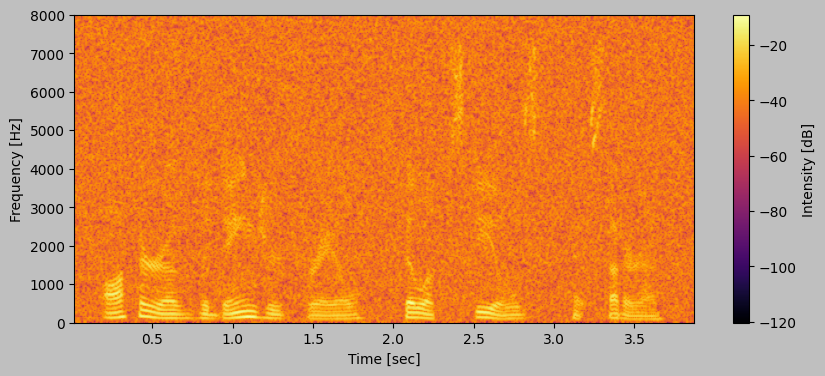

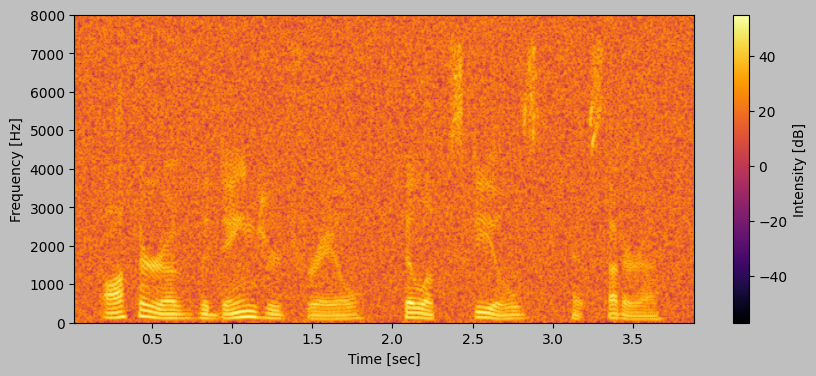

In [16]:
mlbf = MLBF()
clean_wave_files = ["../arctic_a0001.wav"]
doas = np.array([[np.pi / 2.0, 0]])
# 雑音だけの区間のサンプル数を設定
n_noise_only = 40000
mlbf.set_audio_file(clean_wave_files, doas, n_noise_only)

mic_alignments = np.array(
    [
        [-0.01, 0.0, 0.0],
        [0.01, 0.0, 0.0],
    ]
)
mlbf.set_microphone(mic_alignments)

SNR = 2.0
mlbf.run_simulation(SNR)

雑音だけの区間を設けてフィルタを構築したが、イマイチ精度がよくない

# 6.6 最大SNRビームフォーマ (MaxSNR: Maximum SNR Beamformer)

* 出力信号の目的音信号の歪みを 0 にする保証はないが、雑音抑圧量を増やせる
* ステアリングベクトルの代わりに、雑音のみが存在する区間のみを使って情報を算出するため、マイク配置が未知の場合も使用できる

In [17]:
class MaxSNR(MLBF):
    def run_simulation(self, SNR, display_room=False, save_simulated_data=False):
        room = self._create_room()
        source_locations = self._calculate_source_locations()
        self._add_sources_to_room(room, source_locations)
        if display_room:
            room.plot()
        room.simulate(snr=SNR)

        multi_conv_data = room.mic_array.signals  # シミュレーション音源
        self._visualize_audio(multi_conv_data[0, self.n_noise_only:], save_simulated_data)

        t, stft_data = self._calculate_stft(multi_conv_data)
        # 雑音だけの区間のフレーム数
        n_noise_only_frame = np.sum(t < (self.n_noise_only / sample_rate))
        c_hat = self._process_beamforming(stft_data, n_noise_only_frame)  # 引数にステアリングベクトルが不要

        ds_out = self._inverse_stft(c_hat)
        self._visualize_audio(ds_out[self.n_noise_only:])

    def _process_beamforming(self, stft_data, n_noise_only_frame):
        xx_H = np.einsum("mkt,nkt->ktmn", stft_data, np.conjugate(stft_data))
        # 雑音の共分散行列 freq,mic,mic
        Rn = np.average(xx_H[:, :n_noise_only_frame, ...], axis=1)
        # 入力共分散行列
        Rs = np.average(xx_H[:, n_noise_only_frame:, ...], axis=1)

        # 一般化固有値分解
        max_snr_filter = None
        for k in range(int(self.Nk)):
            w, v = scipy.linalg.eigh(Rs[k, ...], Rn[k, ...])
            if max_snr_filter is None:
                max_snr_filter = v[None, :, -1]
            else:
                max_snr_filter = np.concatenate((max_snr_filter, v[None, :, -1]), axis=0)

        Rs_w = np.einsum("kmn,kn->km", Rs, max_snr_filter)
        beta = Rs_w[:, 0] / np.einsum("km,km->k", np.conjugate(max_snr_filter), Rs_w)
        w_max_snr = beta[:, None] * max_snr_filter

        # フィルタをかける
        c_hat = np.einsum("km,mkt->kt", np.conjugate(w_max_snr), stft_data)  # (513, 201)
        return c_hat[np.newaxis, :, :]  # (1, 513, 201)

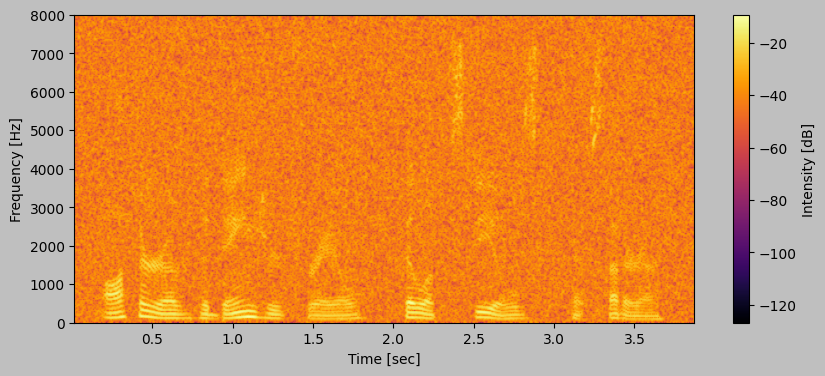

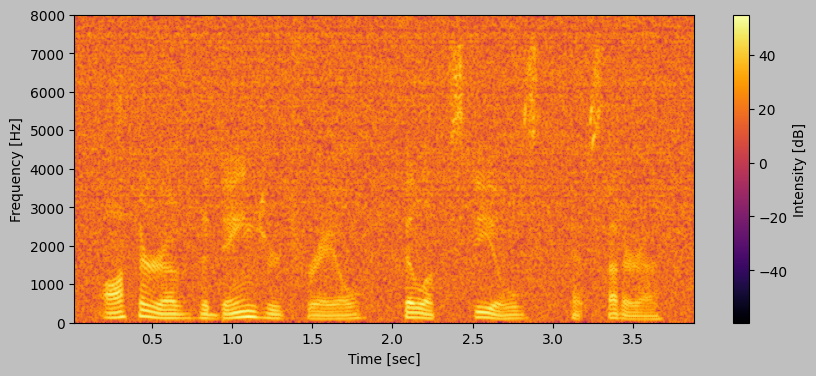

In [18]:
maxsnr = MaxSNR()
clean_wave_files = ["../arctic_a0001.wav"]
doas = np.array([[np.pi / 2.0, 0]])
# 雑音だけの区間のサンプル数を設定
n_noise_only = 40000
maxsnr.set_audio_file(clean_wave_files, doas, n_noise_only)

mic_alignments = np.array(
    [
        [-0.01, 0.0, 0.0],
        [0.01, 0.0, 0.0],
    ]
)
maxsnr.set_microphone(mic_alignments)

SNR = 2.0
maxsnr.run_simulation(SNR, save_simulated_data=True)

# 6.7 マルチチャンネルウィナーフィルタ (MWF: Multi-Channel Wiener Filter)

In [19]:
class MWF(MaxSNR):
    def run_simulation(self, SNR, display_room=False, save_simulated_data=False):
        room = self._create_room()
        source_locations = self._calculate_source_locations()
        self._add_sources_to_room(room, source_locations)
        if display_room:
            room.plot()
        room.simulate(snr=SNR)

        multi_conv_data = room.mic_array.signals  # シミュレーション音源
        self._visualize_audio(multi_conv_data[0, self.n_noise_only:], save_simulated_data)

        t, stft_data = self._calculate_stft(multi_conv_data)
        # 雑音だけの区間のフレーム数
        n_noise_only_frame = np.sum(t < (self.n_noise_only / sample_rate))
        c_hat = self._process_beamforming(stft_data, n_noise_only_frame)  # 引数にステアリングベクトルが不要

        ds_out = self._inverse_stft(c_hat)
        self._visualize_audio(ds_out[0, self.n_noise_only:])

    def _process_beamforming(self, stft_data, n_noise_only_frame):
        xx_H = np.einsum("mkt,nkt->ktmn", stft_data, np.conjugate(stft_data))
        mu = 1.0  # 雑音の倍率
        # 雑音の共分散行列 freq,mic,mic
        Rn = np.average(xx_H[:, :n_noise_only_frame, ...], axis=1)
        # 入力共分散行列
        Rs = np.average(xx_H[:, n_noise_only_frame:, ...], axis=1) - Rn
        # 固有値分解をして半正定行列に変換
        w, v = np.linalg.eigh(Rs)
        w[np.real(w) < 0] = 0
        Rs = np.einsum("kmi,ki,kni->kmn", v, w, np.conjugate(v))
        # 入力共分散行列
        Rs_muRn = Rs + Rn * mu
        invRs_muRn = np.linalg.pinv(Rs_muRn)
        # フィルタ生成
        W_mwf = np.einsum("kmi,kin->kmn", invRs_muRn, Rs)
        # フィルタをかける
        c_hat = np.einsum("kim,ikt->mkt", np.conjugate(W_mwf), stft_data)  # (2, 513, 201)
        return c_hat[:, np.newaxis, :, :]  # (2, 1, 513, 201)

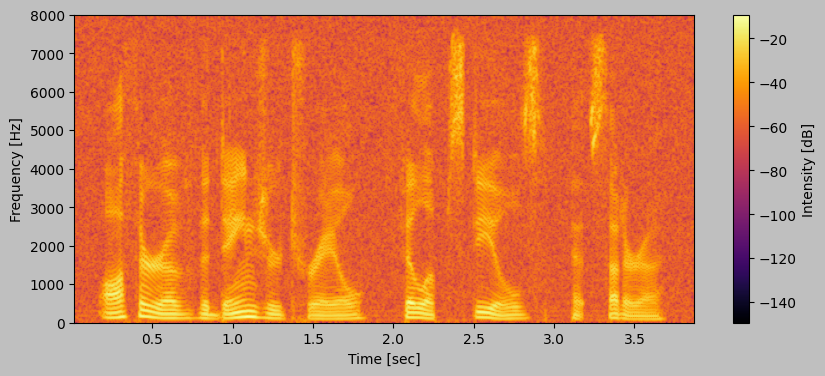

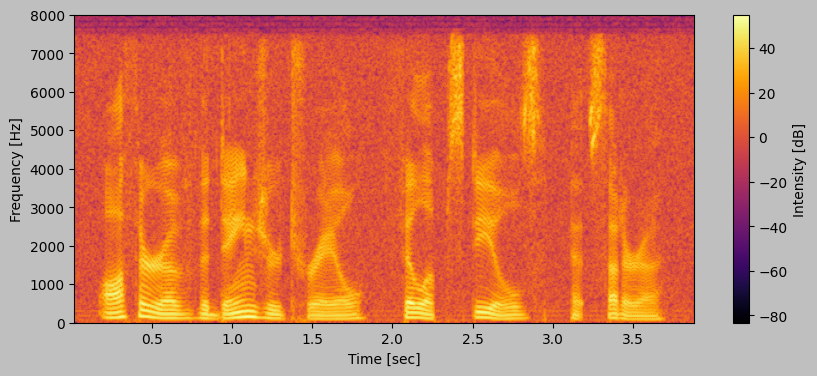

In [20]:
mwf = MWF()
clean_wave_files = ["../arctic_a0001.wav"]
doas = np.array([[np.pi / 2.0, 0]])
n_noise_only = 40000
mwf.set_audio_file(clean_wave_files, doas, n_noise_only)

mic_alignments = np.array(
    [
        [-0.01, 0.0, 0.0],
        [0.01, 0.0, 0.0],
    ]
)
mwf.set_microphone(mic_alignments)

SNR = 20.0
mwf.run_simulation(SNR, save_simulated_data=True)

mu = 1.0 を大きい値に設定するほど雑音抑圧量が増え、音声成分が削られて歪みが増える

## 評価方法

* SNR 向上率：BF を適用する前後でどれだけ SNR が向上したか$$\Delta {SNR} = {SNR}_{\mathrm{post}} - {SNR}_{\mathrm{pre}} = 10 \log_{10} \frac{\Sigma_{t} s_t^2}{\Sigma_{t} (\hat{s}_t - s_t)^2} - 10 \log_{10} \frac{\Sigma_{t} s_t^2}{\Sigma_{t} (x_t - s_t)^2}$$
  * $s_t$: 目的音の時間領域の信号
  * $\hat{s}_t$: 雑音抑圧後の信号
  * $x_t$: マイクロホン入力信号
* DSBF, MVDR, MaxSNR, MWF の SNR 向上率を比較

In [21]:
def write_file_from_time_signal(signal, file_name, sample_rate):
    signal = signal.astype(np.int16)
    with wave.open(file_name, "w") as wave_out:
        wave_out.setnchannels(1)
        wave_out.setsampwidth(2)
        wave_out.setframerate(sample_rate)
        wave_out.writeframes(signal)


# 遅延和アレイを実行する
# x:入力信号(M, Nk, Lt)
# a:ステアリングベクトル(Nk, M)
# return y 出力信号(M, Nk, Lt)
def execute_dsbf(x, a):
    # 遅延和アレイを実行する
    s_hat = np.einsum("km,mkt->kt", np.conjugate(a), x)
    # ステアリングベクトルをかける
    c_hat = np.einsum("kt,km->mkt", s_hat, a)
    return c_hat


# MVDRを実行する
# x:入力信号(M, Nk, Lt)
# y:共分散行列を計算する信号(M,Nk,Lt)
# a:ステアリングベクトル(Nk, M)
# return y 出力信号(M, Nk, Lt)
def execute_mvdr(x, y, a):
    # 共分散行列を計算する
    Rcov = np.einsum("mkt,nkt->kmn", y, np.conjugate(y))
    # 共分散行列の逆行列を計算する
    Rcov_inverse = np.linalg.pinv(Rcov)
    # フィルタを計算する
    Rcov_inverse_a = np.einsum("kmn,kn->km", Rcov_inverse, a)
    a_H_Rcov_inverse_a = np.einsum("kn,kn->k", np.conjugate(a), Rcov_inverse_a)
    w_mvdr = Rcov_inverse_a / np.maximum(a_H_Rcov_inverse_a, 1.0e-18)[:, None]
    # フィルタをかける
    s_hat = np.einsum("km,mkt->kt", np.conjugate(w_mvdr), x)
    # ステアリングベクトルをかける
    c_hat = np.einsum("kt,km->mkt", s_hat, a)
    return c_hat


# MaxSNRを実行する
# x:入力信号(M, Nk, Lt)
# y:共分散行列を計算する信号(M,Nk,Lt)
# return y 出力信号(M, Nk, Lt)
def execute_max_snr(x, y):
    # 雑音の共分散行列 freq,mic,mic
    Rn = np.average(np.einsum("mkt,nkt->ktmn", y, np.conjugate(y)), axis=1)
    # 入力共分散行列
    Rs = np.average(np.einsum("mkt,nkt->ktmn", x, np.conjugate(x)), axis=1)
    # 周波数の数を取得
    Nk = np.shape(Rs)[0]
    # 一般化固有値分解
    max_snr_filter = None
    for k in range(Nk):
        w, v = scipy.linalg.eigh(Rs[k, ...], Rn[k, ...])
        if max_snr_filter is None:
            max_snr_filter = v[None, :, -1]
        else:
            max_snr_filter = np.concatenate((max_snr_filter, v[None, :, -1]), axis=0)
    Rs_w = np.einsum("kmn,kn->km", Rs, max_snr_filter)
    beta = Rs_w / np.einsum("km,km->k", np.conjugate(max_snr_filter), Rs_w)[:, None]
    w_max_snr = beta[:, None, :] * max_snr_filter[..., None]
    # フィルタをかける
    c_hat = np.einsum("kim,ikt->mkt", np.conjugate(w_max_snr), x)
    return c_hat


# SNRをはかる
# desired: 目的音、Lt
# out: 雑音除去後の信号 Lt
def calculate_snr(desired, out):
    wave_length = np.minimum(np.shape(desired)[0], np.shape(out)[0])
    # 消し残った雑音
    desired = desired[:wave_length]
    out = out[:wave_length]
    noise = desired - out
    snr = 10.0 * np.log10(np.sum(np.square(desired)) / np.sum(np.square(noise)))
    return snr


# ファイルに書き込む
# MWFを実行する
# x:入力信号(M, Nk, Lt)
# y:共分散行列を計算する信号(M,Nk,Lt)
# mu: 雑音共分散行列の係数
# return y 出力信号(M, Nk, Lt)
def execute_mwf(x, y, mu):
    # 雑音の共分散行列 freq,mic,mic
    Rn = np.average(np.einsum("mkt,nkt->ktmn", y, np.conjugate(y)), axis=1)
    # 入力共分散行列
    Rs = np.average(np.einsum("mkt,nkt->ktmn", x, np.conjugate(x)), axis=1)
    # 固有値分解をして半正定行列に変換
    w, v = np.linalg.eigh(Rs)
    w[np.real(w) < 0] = 0
    Rs = np.einsum("kmi,ki,kni->kmn", v, w, np.conjugate(v))
    # 入力共分散行列
    Rs_muRn = Rs + Rn * mu
    invRs_muRn = np.linalg.pinv(Rs_muRn)
    # フィルタ生成
    W_mwf = np.einsum("kmi,kin->kmn", invRs_muRn, Rs)
    # フィルタをかける
    c_hat = np.einsum("kim,ikt->mkt", np.conjugate(W_mwf), x)
    return c_hat


def compare_snr(clean_wave_files, doas):
    n_noise_only = 40000

    # 音源数
    n_sources = len(clean_wave_files)

    # 長さを調べる
    n_samples = 0
    # ファイルを読み込む
    for clean_wave_file in clean_wave_files:
        wav = wave.open(clean_wave_file)
        if n_samples < wav.getnframes():
            n_samples = wav.getnframes()
        wav.close()

    clean_data = np.zeros([n_sources, n_samples + n_noise_only])

    # ファイルを読み込む
    s = 0
    for clean_wave_file in clean_wave_files:
        wav = wave.open(clean_wave_file)
        data = wav.readframes(wav.getnframes())
        data = np.frombuffer(data, dtype=np.int16)
        data = data / np.iinfo(np.int16).max
        clean_data[s, n_noise_only : n_noise_only + wav.getnframes()] = data
        wav.close()
        s = s + 1

    sample_rate = 16000
    N = 1024
    Nk = int(N / 2 + 1)
    freqs = np.arange(0, Nk, 1) * sample_rate / N
    SNR = 10.0
    room_dim = np.r_[10.0, 10.0, 10.0]
    mic_array_loc = room_dim / 2 + np.random.randn(3) * 0.1
    mic_alignments = np.array([[x, 0.0, 0.0] for x in np.arange(-0.01, 0.02, 0.02)])
    n_channels = np.shape(mic_alignments)[0]
    R = mic_alignments.T + mic_array_loc[:, None]

    # 部屋を生成する
    room = pa.ShoeBox(room_dim, fs=sample_rate, max_order=17, absorption=0.4)
    room_no_noise = pa.ShoeBox(room_dim, fs=sample_rate, max_order=17, absorption=0.4)

    # 用いるマイクロホンアレイの情報を設定する
    room.add_microphone_array(pa.MicrophoneArray(R, fs=room.fs))
    room_no_noise.add_microphone_array(pa.MicrophoneArray(R, fs=room.fs))

    # 音源とマイクロホンの距離
    distance = 1.0
    source_locations = np.zeros((3, doas.shape[0]), dtype=doas.dtype)
    source_locations[0, :] = np.cos(doas[:, 1]) * np.sin(doas[:, 0])
    source_locations[1, :] = np.sin(doas[:, 1]) * np.sin(doas[:, 0])
    source_locations[2, :] = np.cos(doas[:, 0])
    source_locations *= distance
    source_locations += mic_array_loc[:, None]

    # 各音源をシミュレーションに追加する
    for s in range(len(clean_wave_files)):
        clean_data[s] /= np.std(clean_data[s])
        room.add_source(source_locations[:, s], signal=clean_data[s])
        if s == 0:
            room_no_noise.add_source(source_locations[:, s], signal=clean_data[s])

    # シミュレーションを回す
    room.simulate(snr=SNR)
    room_no_noise.simulate(snr=90)

    # 畳み込んだ波形を取得する(チャンネル、サンプル）
    multi_conv_data = room.mic_array.signals
    multi_conv_data_no_noise = room_no_noise.mic_array.signals


    # 畳み込んだ波形をファイルに書き込む
    write_file_from_time_signal(multi_conv_data_no_noise[0, n_noise_only:] * np.iinfo(np.int16).max / 20.0, "./mwf_clean.wav", sample_rate)

    # 畳み込んだ波形をファイルに書き込む
    write_file_from_time_signal(multi_conv_data[0, n_noise_only:] * np.iinfo(np.int16).max / 20.0, "./mwf_in.wav", sample_rate)

    # Near仮定に基づくステアリングベクトルを計算: steering_vectors(Nk x Ns x M)
    near_steering_vectors = calculate_steering_vector(R, source_locations, freqs, is_use_far=False)

    # 短時間フーリエ変換を行う
    f, t, stft_data = sp.stft(multi_conv_data, fs=sample_rate, window="hann", nperseg=N)

    # 雑音だけの区間のフレーム数
    n_noise_only_frame = np.sum(t < (n_noise_only / sample_rate))

    # 雑音だけのデータ
    noise_data = stft_data[..., :n_noise_only_frame]

    # MWFの雑音の倍率
    mu = 1.0

    # それぞれのフィルタを実行する
    dsbf_out = execute_dsbf(stft_data, near_steering_vectors[:, 0, :])
    mvdr_out = execute_mvdr(stft_data, stft_data, near_steering_vectors[:, 0, :])
    mlbf_out = execute_mvdr(stft_data, noise_data, near_steering_vectors[:, 0, :])
    max_snr_out = execute_max_snr(stft_data, noise_data)
    mwf_out = execute_mwf(stft_data, noise_data, mu)

    # 評価するマイクロホン
    eval_mic_index = 0

    # 時間領域の波形に戻す
    t, dsbf_out = sp.istft(dsbf_out[eval_mic_index], fs=sample_rate, window="hann", nperseg=N)
    t, mvdr_out = sp.istft(mvdr_out[eval_mic_index], fs=sample_rate, window="hann", nperseg=N)
    t, mlbf_out = sp.istft(mlbf_out[eval_mic_index], fs=sample_rate, window="hann", nperseg=N)
    t, max_snr_out = sp.istft(max_snr_out[eval_mic_index], fs=sample_rate, window="hann", nperseg=N)
    t, mwf_out = sp.istft(mwf_out[eval_mic_index], fs=sample_rate, window="hann", nperseg=N)

    # SNRをはかる
    snr_pre = calculate_snr(multi_conv_data_no_noise[eval_mic_index, n_noise_only:], multi_conv_data[eval_mic_index, n_noise_only:])
    snr_dsbf_post = calculate_snr(multi_conv_data_no_noise[eval_mic_index, n_noise_only:], dsbf_out[n_noise_only:])
    snr_mvdr_post = calculate_snr(multi_conv_data_no_noise[eval_mic_index, n_noise_only:], mvdr_out[n_noise_only:])
    snr_mlbf_post = calculate_snr(multi_conv_data_no_noise[eval_mic_index, n_noise_only:], mlbf_out[n_noise_only:])
    snr_max_snr_post = calculate_snr(multi_conv_data_no_noise[eval_mic_index, n_noise_only:], max_snr_out[n_noise_only:])
    snr_mwf_post = calculate_snr(multi_conv_data_no_noise[eval_mic_index, n_noise_only:], mwf_out[n_noise_only:])

    # ファイルに書き込む
    write_file_from_time_signal(multi_conv_data[eval_mic_index, n_noise_only:] * np.iinfo(np.int16).max / 20.0, "./mix.wav", sample_rate)
    write_file_from_time_signal(multi_conv_data_no_noise[eval_mic_index, n_noise_only:] * np.iinfo(np.int16).max / 20.0, "./desired.wav", sample_rate)
    write_file_from_time_signal(dsbf_out[n_noise_only:] * np.iinfo(np.int16).max / 20.0, "./dsbf_out.wav", sample_rate)
    write_file_from_time_signal(mvdr_out[n_noise_only:] * np.iinfo(np.int16).max / 20.0, "./mvdr_out.wav", sample_rate)
    write_file_from_time_signal(mlbf_out[n_noise_only:] * np.iinfo(np.int16).max / 20.0, "./mlbf_out.wav", sample_rate)
    write_file_from_time_signal(max_snr_out[n_noise_only:] * np.iinfo(np.int16).max / 20.0, "./max_snr_out.wav", sample_rate)
    write_file_from_time_signal(mwf_out[n_noise_only:] * np.iinfo(np.int16).max / 20.0, "./mwf_out.wav", sample_rate)

    print("method:    ", "DSBF", "MVDR", "MLBF", "MaxSNR", "MWF")
    print(f"Δsnr [dB]: {(snr_dsbf_post - snr_pre):.2f} {(snr_mvdr_post - snr_pre):.2f} {(snr_mlbf_post - snr_pre):.2f} {(snr_max_snr_post - snr_pre):.2f} {(snr_mwf_post - snr_pre):.2f}")

### 音源が 1 つの場合

* MVDR だけ性能が低いが、そのほかの性能は概ね同程度
* MVDR は共分散行列を入力信号から求めているが、入力信号には干渉音だけでなく目的音も存在するため、目的音がある意味外乱となり共分散行列の推定精度が下がっている

In [22]:
clean_wave_files = ["../arctic_a0001.wav"]
doas = np.array([[np.pi / 2.0, 0]])
compare_snr(clean_wave_files, doas)

method:     DSBF MVDR MLBF MaxSNR MWF
Δsnr [dB]: 2.89 2.24 2.85 2.85 2.99


### 音源が 2 つの場合

* MVDR が最も良い性能
* MLBF, MaxSNR, MWF では、雑音の共分散行列を計算する時間帯に雑音が存在していないため雑音を消すことができない

In [23]:
clean_wave_files = ["../arctic_a0001.wav", "../arctic_a0002.wav"]
doas = np.array([[np.pi / 2.0, 0], [np.pi / 2.0, np.pi]])
compare_snr(clean_wave_files, doas)

method:     DSBF MVDR MLBF MaxSNR MWF
Δsnr [dB]: 0.93 4.47 0.91 0.30 0.55
